In [1]:
fig_save_path = '/data/peer/wallet/Jupyter/2023_Particle_SASP/figures/'

In [2]:
DATA_DIR = '/data/peer/wallet/Jupyter/2023_Particle_SASP/data/'

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import scipy.sparse as sparse
import matplotlib.pyplot as plt
import seaborn as sns
from kneed import KneeLocator
from scanpy.external.pp import magic
import scanpy.external as sce




In [4]:
from scrnaseq_preprocessing_utils import *

In [5]:
color_map_clusters_nogrey = ["#FFFF00", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]
blue_red = ['#DE2A1B','#1B2ADE',"#1CE6FF", ]
#scanpy layout
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=True, ipython_format='png2x')
sns.set_style('white')
sc.settings.verbosity = 3

In [6]:

batlow_20 = ['#1d2356','#1d2b59',
'#14375e',
'#134460',
'#1c5261',
'#235f5f',
'#396a58',
'#4c714e',
'#607843',
'#757e36',
'#8d8532',
'#a78b30',
'#c49138',
'#dc954d',
'#f09c6a',
'#f8a487',
'#f8aca2',
'#f8b5be',
'#f8c2d9',
'#eecbe1'] 
import random
random.seed(1)
random.shuffle(batlow_20)


# reannotate immune

In [7]:
adata_path = DATA_DIR + 'TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP.h5ad'
adata_save_path = DATA_DIR + 'TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP_{}hv.h5ad'
immune_markers_path = '/data/peer/wallet/Jupyter/2023_Particle_SASP/2023_Particle_SASP/'+'immune_marker_panel_clean_210216.csv'
marker_gene_path = '/data/peer/wallet/Jupyter/2023_Particle_SASP/2023_Particle_SASP/230529_marker_genes_hv.csv'
marker_gene_sets =['B_important_marker']#'B_important_marker','M_important_marker', 'DC_important_marker',
use_hv_genes = True
add_marker_genes=True
number_of_hv_genes = 7500


pheno_names = ['pheno_var_BP_k10','pheno_var_BP_k20','pheno_var_BP_k30','pheno_var_BP_k40','pheno_var_BP_k50','pheno_var_BP_k60','pheno_var_BP_k70',
              'pheno_var_BP_k80','pheno_var_BP_k90','pheno_var_BP_k100']

#pheno_names = ['pheno_k10','pheno_k20','pheno_k30','pheno_k40','pheno_k50','pheno_k60','pheno_k70',
 #             'pheno_k80','pheno_k90','pheno_k100']
pheno_ks = [10,20,30,40,50,60,70,80,90,100]

min_cells_per_gene = 10

min_gene_number = 50

In [8]:
adata = sc.read(adata_path)
adata

AnnData object with n_obs × n_vars = 1462 × 16286
    obs: 'sampleid', 'n_genes', 'n_counts', 'scrublet_scores', 'pid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'batch', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_memory_resting', 'CD4_memory_activated', 'CD4_follicular_helper', 'CD4_regulatory', 'NK_resting', 'NK_activated', 'B_cell', 'Plasma', 'Bcell_naive', 'Bcell_memory', 'IMMUNE', 'PanCAF', 'iCAF', 'myCAF', 'apCAF'

In [9]:
sc.pp.filter_genes(adata, min_cells=min_cells_per_gene)

filtered out 5742 genes that are detected in less than 10 cells


In [10]:
adata

AnnData object with n_obs × n_vars = 1462 × 10544
    obs: 'sampleid', 'n_genes', 'n_counts', 'scrublet_scores', 'pid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'batch', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_memory_resting', 'CD4_memory_activated', 'CD4_follicular_helper', 'CD4_regulatory', 'NK_resting', 'NK_activated', 'B_cell', 'Plasma', 'Bcell_naive', 'Bcell_memory', 'IMMUNE', 'PanCAF', 'iCAF', 'myCAF', 'apCAF'

In [11]:
sc.pp.filter_cells(adata, min_genes= min_gene_number)


In [12]:
adata

AnnData object with n_obs × n_vars = 1462 × 10544
    obs: 'sampleid', 'n_genes', 'n_counts', 'scrublet_scores', 'pid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'batch', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_memory_resting', 'CD4_memory_activated', 'CD4_follicular_helper', 'CD4_regulatory', 'NK_resting', 'NK_activated', 'B_cell', 'Plasma', 'Bcell_naive', 'Bcell_memory', 'IMMUNE', 'PanCAF', 'iCAF', 'myCAF', 'apCAF'

In [13]:
if use_hv_genes:
    sc.pp.highly_variable_genes(adata,  flavor='cell_ranger', n_top_genes=number_of_hv_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [14]:
number_of_hv_genes

7500

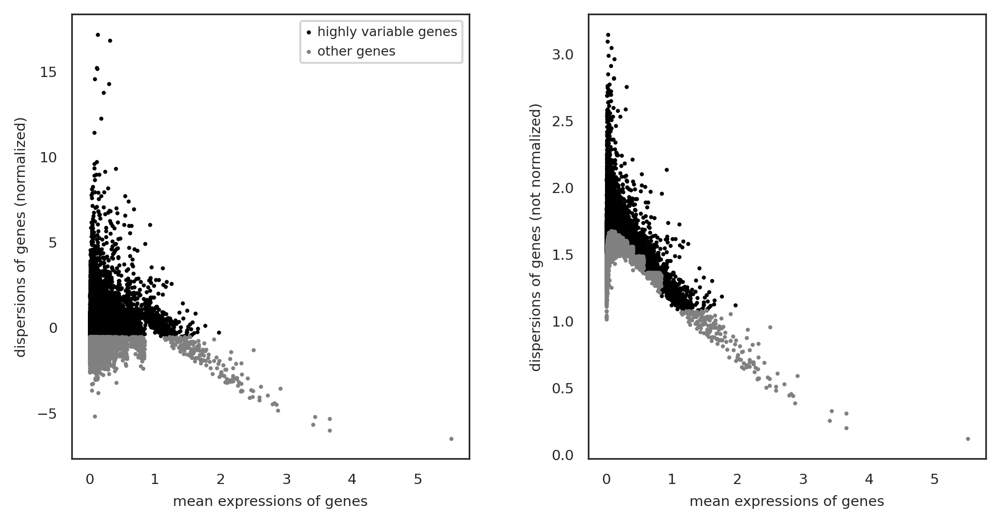

In [15]:
if use_hv_genes:
    sc.pl.highly_variable_genes(adata,  show=None, save=None, highly_variable_genes=True)

In [16]:
if add_marker_genes and use_hv_genes:
    marker_genes_df = pd.read_csv(marker_gene_path,index_col=['gene_name'])


In [17]:
#limit to human only
if add_marker_genes and use_hv_genes:
    marker_genes_df = marker_genes_df[marker_genes_df['species'] == 'homo_sapiens']
    marker_genes_df

In [18]:
#limit to markers used for distinguishing immune cells
if add_marker_genes and use_hv_genes:
    marker_genes_df = marker_genes_df[marker_gene_sets]
    marker_genes_df

In [19]:
#extract gene names
if add_marker_genes and use_hv_genes:
    marker_lists = []
    for i in marker_gene_sets:
        marker_genes_list = list(set(marker_genes_df[marker_genes_df[i]==True].index))
        marker_lists.append(marker_genes_list)
    marker_lists

In [20]:
#concatenate lists
if add_marker_genes and use_hv_genes:
    import itertools
    a = marker_lists
    marker_genes = list(itertools.chain.from_iterable(a))
    marker_genes

In [21]:
#set important marker genes as highly variable
if add_marker_genes and use_hv_genes:
    for i in marker_genes:
        if i in adata.var_names:
            adata.var['highly_variable'][i]= True
        else:
            print(i, 'not found')

IL13 not found
CD24 not found
IL10 not found
IL12A not found
IL12B not found
HLA-DRB4 not found
IL17B not found
TLR4 not found
PDCD1 not found
MS4A2 not found
GZMB not found
TNFRSF13C  not found
IL22 not found
HLA-DRB3 not found
CSF2 not found
IL6 not found
IL5 not found
IL17F not found
CXCR3 not found
IGHE not found
IL17A not found
TNF not found
PRSS3 not found
IL4 not found
SDC1 not found
IL2 not found
CCL3 not found
TGFB2 not found


/scratch/lsftmp/18708082.tmpdir/ipykernel_415685/4083173082.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.var['highly_variable'][i]= True


computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:12)


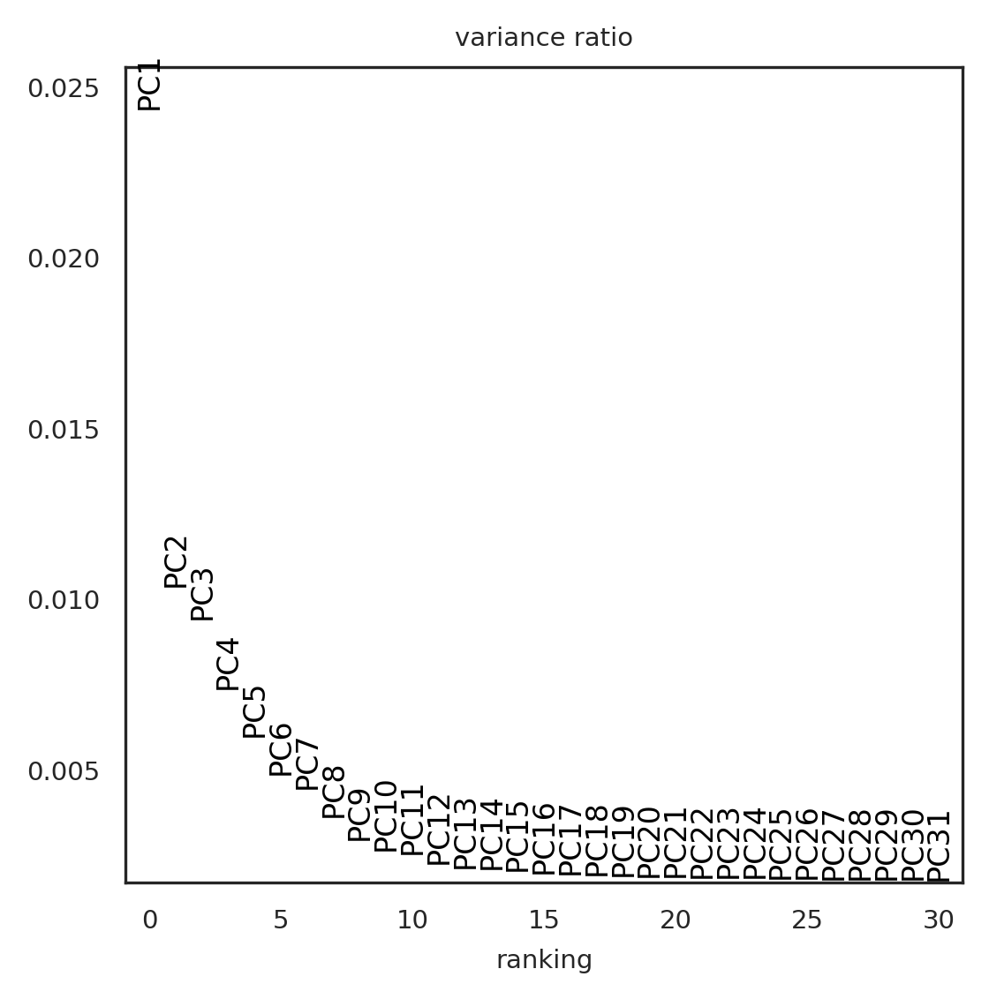

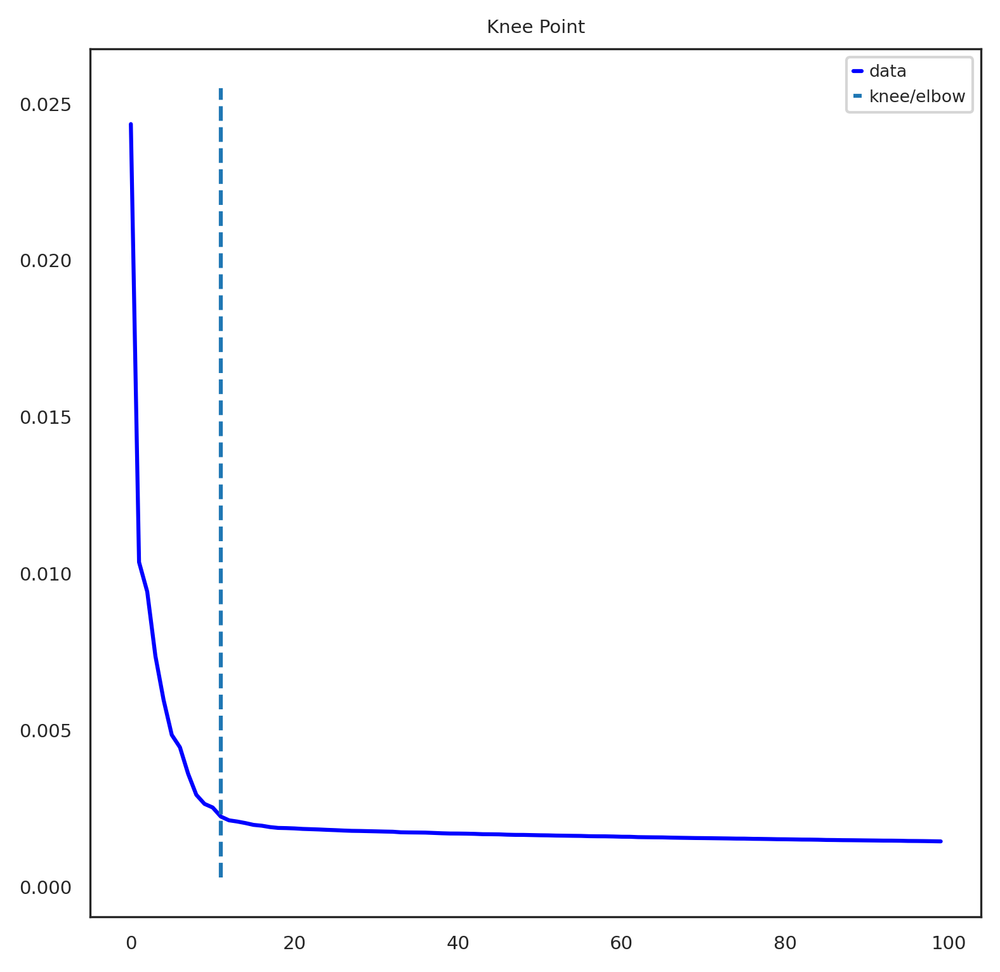

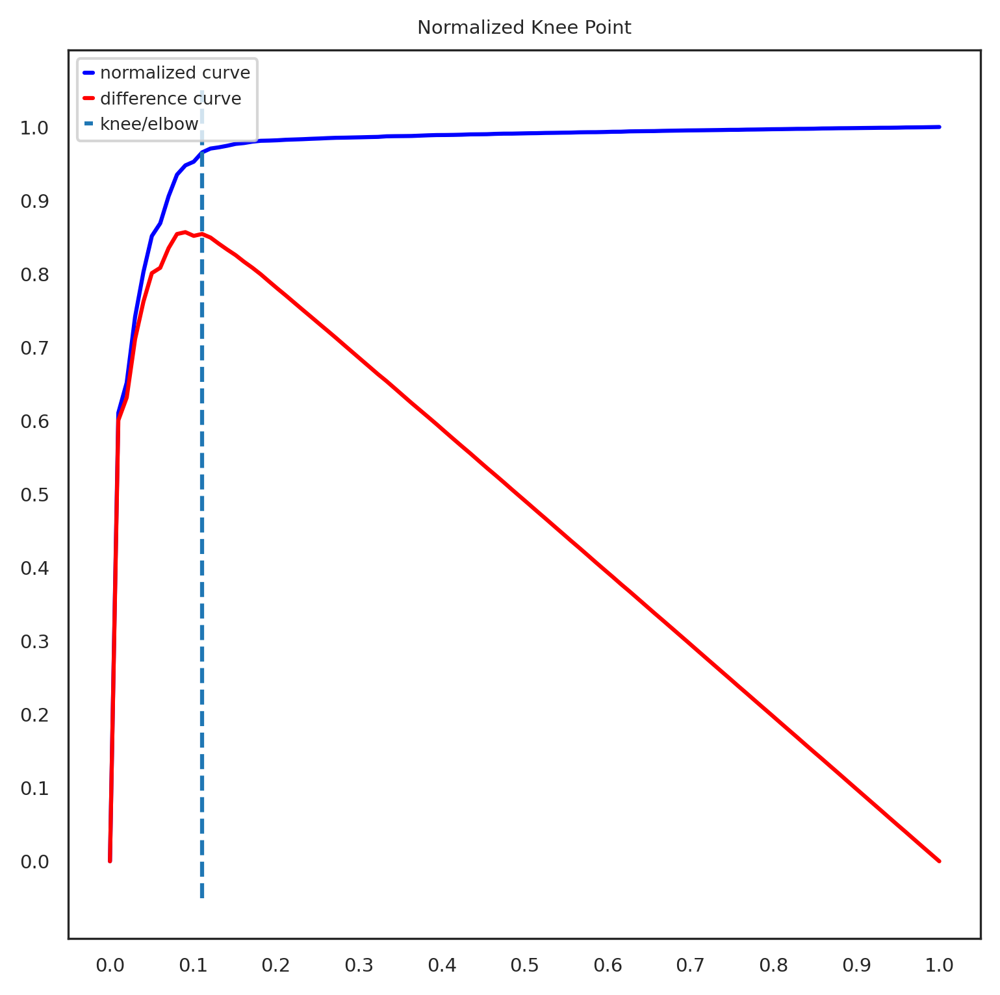

Kneepoint happens at PC: 11
11 PC explain 7.84771628677845 % of variance
2 PC explain 3.4712771885097027 % of variance
3 PC explain 4.413332417607307 % of variance
4 PC explain 5.149950599297881 % of variance
5 PC explain 5.746456049382687 % of variance
6 PC explain 6.231226306408644 % of variance
7 PC explain 6.676309602335095 % of variance
8 PC explain 7.0368645479902625 % of variance
9 PC explain 7.3303221724927425 % of variance
10 PC explain 7.594775594770908 % of variance
11 PC explain 7.84771628677845 % of variance
12 PC explain 8.071576012298465 % of variance
13 PC explain 8.283520373515785 % of variance
14 PC explain 8.49161222577095 % of variance
15 PC explain 8.69479759130627 % of variance
16 PC explain 8.892174018546939 % of variance
17 PC explain 9.08692863304168 % of variance
18 PC explain 9.277336916420609 % of variance
19 PC explain 9.465041023213416 % of variance
20 PC explain 9.652129677124321 % of variance
21 PC explain 9.838233818300068 % of variance
22 PC explain 10

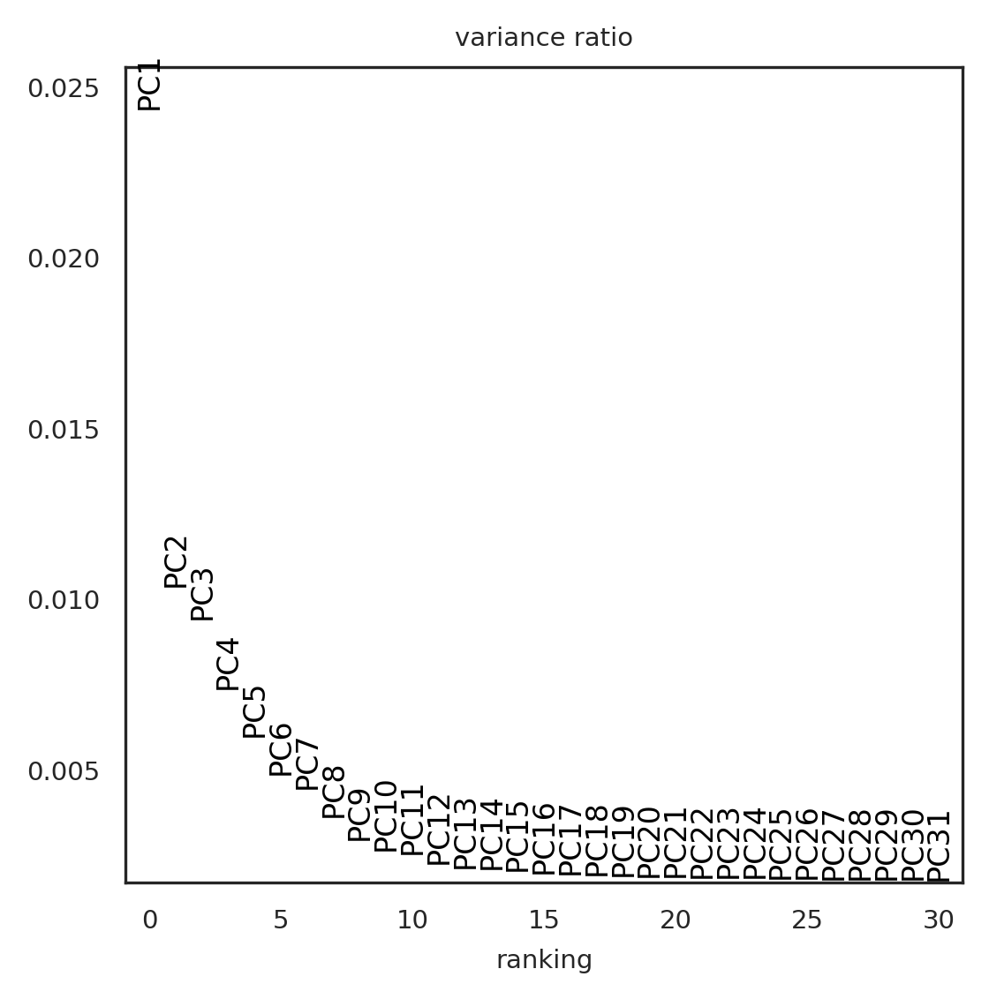

In [22]:
if use_hv_genes:
    number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=True)
else:
    number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=False)

In [23]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=number_of_PC_used)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 100
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [24]:
for i,v in enumerate(pheno_names):
    result_pheno_ndf_all = sce.tl.phenograph(adata.obsm['X_pca'], k = pheno_ks[i], seed=1)
    adata.obs[v] = pd.Categorical(result_pheno_ndf_all[0])

PhenoGraph clustering
Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3251214027404785 seconds
Jaccard graph constructed in 2.2008347511291504 seconds
Wrote graph to binary file in 0.008736610412597656 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.829817
After 2 runs, maximum modularity is Q = 0.831393
Louvain completed 22 runs in 0.4617457389831543 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.830509424209595 seconds
    finished (0:00:04)
PhenoGraph clustering
Finding 20 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.30820512771606445 seconds
Jaccard graph constructed in 2.015479803085327 seconds
Wrote graph to binary file in 0.01566171646118164 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.789809
Louvain completed 21 runs in 0.4339170455932617 seconds
Sorting communities by siz

In [25]:
#impute data
adata_indf = magic(adata, copy=True, verbose=True, solver='exact', n_pca=adata.obsm['X_pca'].shape[1], knn=5, t=3)
adata.layers['imputed'] = adata_indf.X

computing MAGIC
Calculating MAGIC...
  Running MAGIC on 1462 cells and 10544 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 2.38 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.25 seconds.
    Calculating affinities...
    Calculated affinities in 0.24 seconds.
  Calculated graph and diffusion operator in 2.87 seconds.
  Running MAGIC with `solver='exact'` on 10544-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 0.50 seconds.
Calculated MAGIC in 3.46 seconds.
    finished (0:00:03)


In [26]:
adata_save_path.format(str(number_of_hv_genes))

'/data/peer/wallet/Jupyter/2023_Particle_SASP/data/TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP_7500hv.h5ad'

In [27]:
adata.write(adata_save_path.format(str(number_of_hv_genes)))
print('saved data to:',adata_save_path.format(str(number_of_hv_genes)))

saved data to: /data/peer/wallet/Jupyter/2023_Particle_SASP/data/TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP_7500hv.h5ad


# plot cells

In [126]:
#adata paths
pheno_names = ['pheno_var_BP_k10','pheno_var_BP_k20','pheno_var_BP_k30','pheno_var_BP_k40','pheno_var_BP_k50','pheno_var_BP_k60','pheno_var_BP_k70',
              'pheno_var_BP_k80','pheno_var_BP_k90','pheno_var_BP_k100']
pheno_heat = 'pheno_var_BP_k30'  
adata_path = DATA_DIR + 'TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP_2500hv.h5ad'

#pheno_names = ['pheno_k10','pheno_k20','pheno_k30','pheno_k40','pheno_k50','pheno_k60','pheno_k70',
#               'pheno_k80','pheno_k90','pheno_k100']
#adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_raw_data_annotated_emptydrops_noribo_nomito_clustered_nodrops_doublets_nodoubs_libsize_log1p_clustered_10000hv_genes_curated_marker_genes_210216_leukocytes_scran_annotated_clustered_imputed.h5ad'
#set parameters
imputed = True
continue_with_adata = False #load new adata indicated by paths below or continue with loaded adata object
B_genes = ['MS4A1','CD19','CD27','SDC1','AICDA','IGHD','IGHM','IGHG1','IGHG2B','IGHG2C','IGHA']
marker_genes = [B_genes]
marker_genes_filtered = [[]]

In [121]:
np.sum(adata.uns['pca']['variance_ratio'])

0.25008494

In [76]:
import cytopus as cp
G = cp.kb.KnowledgeBase()

KnowledgeBase object containing 75 cell types and 201 cellular processes



In [77]:
#load AnnData object
if continue_with_adata == False:
    adata = sc.read(adata_path)

In [127]:
adata

AnnData object with n_obs × n_vars = 1462 × 10544
    obs: 'sampleid', 'n_genes', 'n_counts', 'scrublet_scores', 'pid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'batch', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_memory_resting', 'CD4_memory_activated', 'CD4_follicular_helper', 'CD4_regulatory', 'NK_resting', 'NK_activated', 'B_cell', 'Plasma', 'Bcell_naive', 'Bcell_memory', 'IMMUNE', 'PanCAF', 'iCAF', 'myCAF', 'apCAF'

In [128]:
# Filter out genes not present in single cell data
for i,v in enumerate(marker_genes):
    for marker in v:
        if marker in adata.var.index:   
            marker_genes_filtered[i].append(marker)
            marker_genes_filtered[i] = list(set(marker_genes_filtered[i]))
        else:
            print(marker + ' filtered out')
            

SDC1 filtered out
IGHG2B filtered out
IGHG2C filtered out
IGHA filtered out


In [129]:
#imputed variable serves to define option in sc.pl.umap function

if imputed == True:
    select_layer = 'imputed'
else:
    select_layer = None

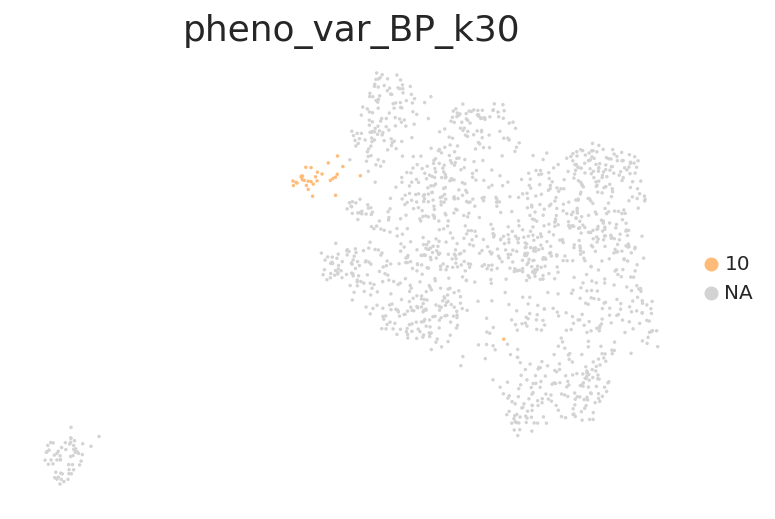

In [130]:
sc.pl.umap(adata, color = 'pheno_var_BP_k30', groups=[10],layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

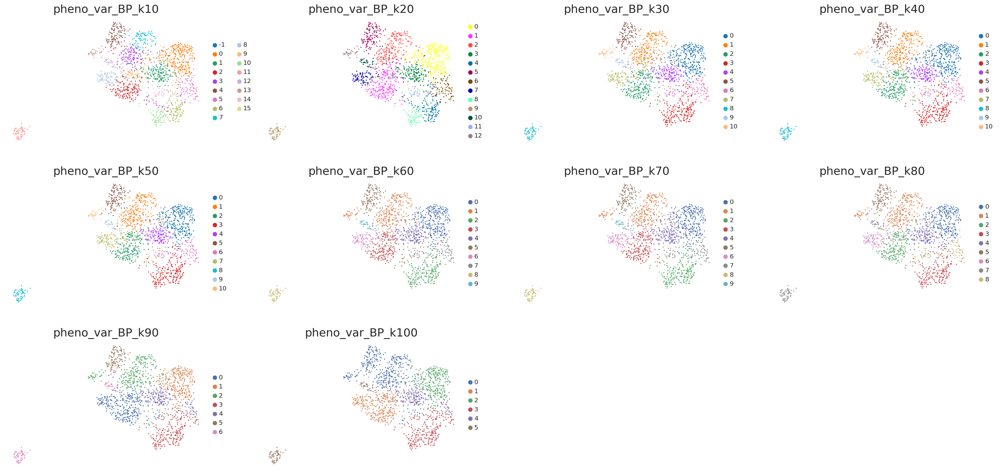

In [131]:
sc.pl.umap(adata, color = pheno_names, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

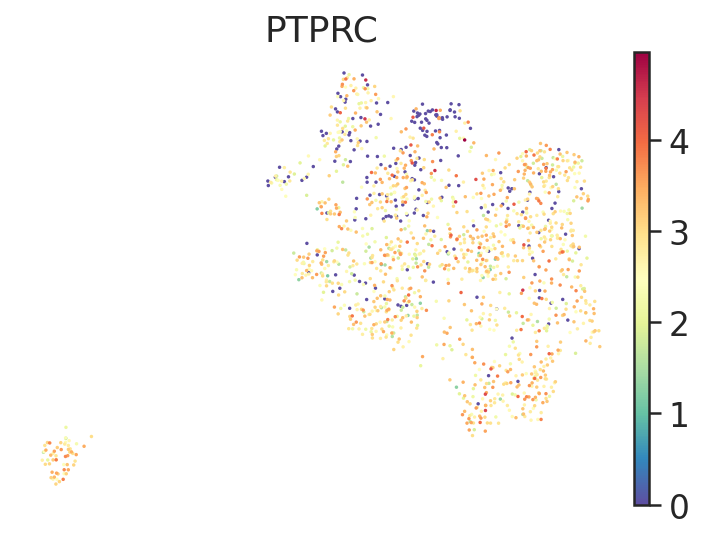

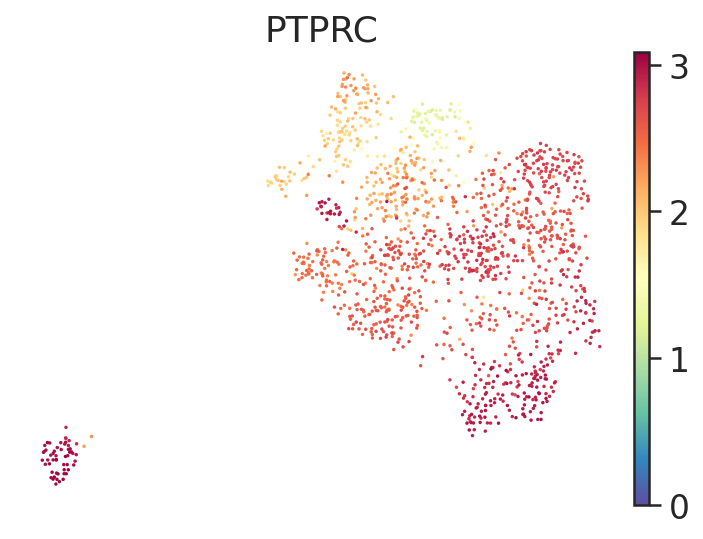

In [132]:
#stem cells, erythrocyte contamination
genes_oi = ['PTPRC','HBB','HBA1','HBA2','CD34']
genes_oi = [x for x in genes_oi if x in adata.var_names]
sc.pl.umap(adata, color = genes_oi, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = genes_oi, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

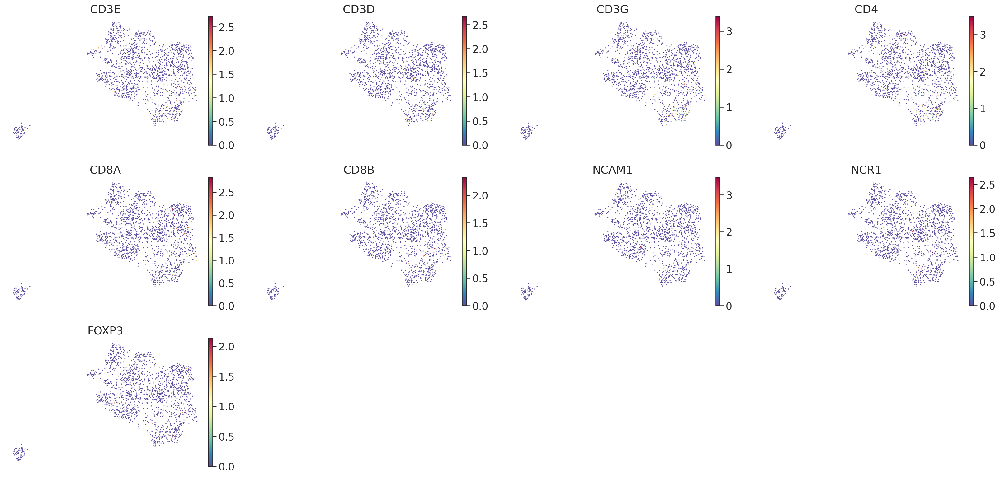

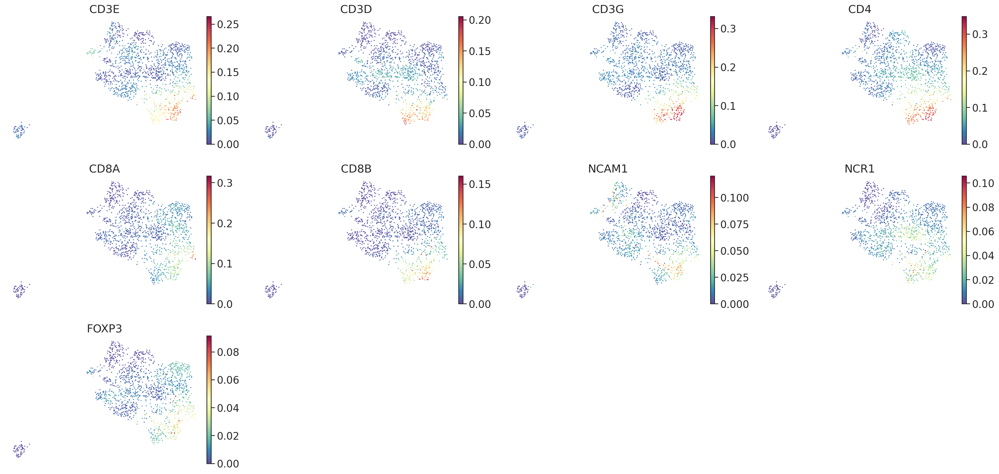

In [133]:
#markers
genes_oi = ['CD3E','CD3D','CD3G','CD4','CD8A','CD8B','NCAM1','NCR1','FCGR3A','FOXP3']
genes_oi = [x for x in genes_oi if x in adata.var_names]
sc.pl.umap(adata, color = genes_oi, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = genes_oi, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

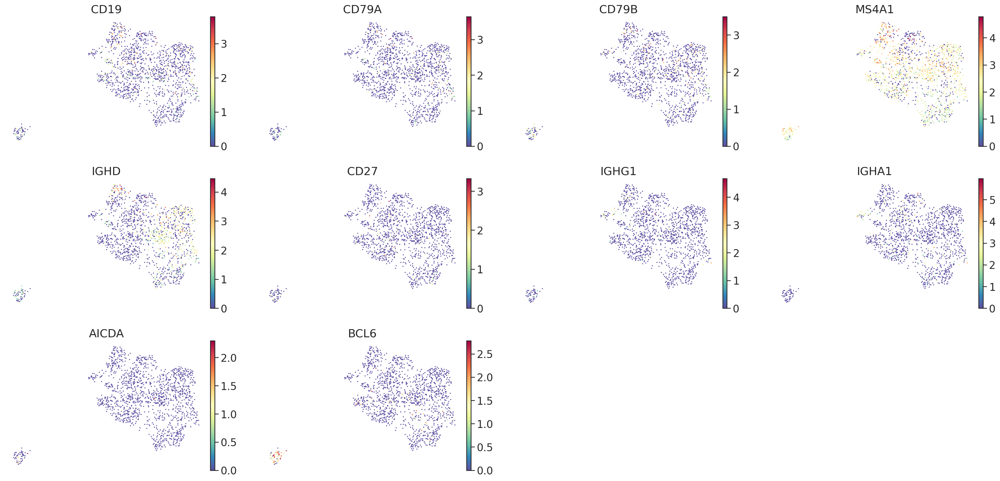

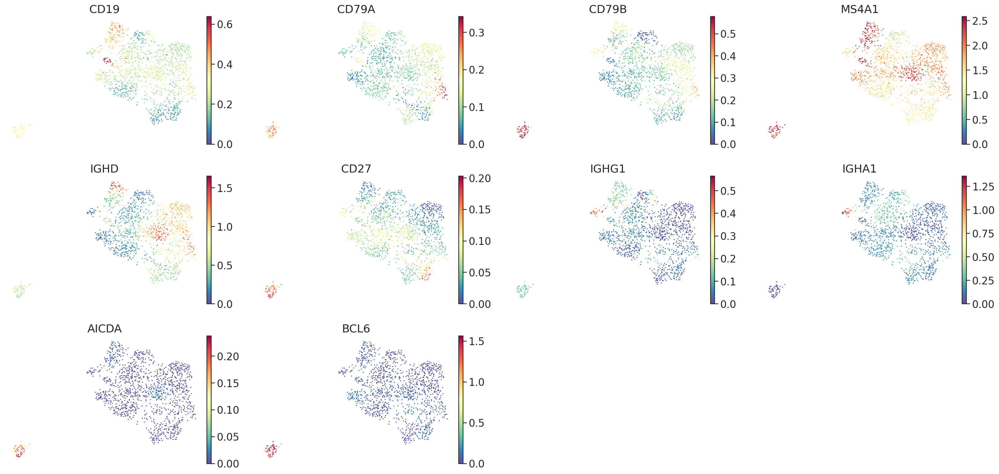

In [134]:
#markers
genes_oi = ['CD19','CD79A','CD79B','MS4A1','IGHD','CD27','SDC1','IGHG1','IGHA1','AICDA','BCL6']
genes_oi = [x for x in genes_oi if x in adata.var_names]
sc.pl.umap(adata, color = genes_oi, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = genes_oi, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

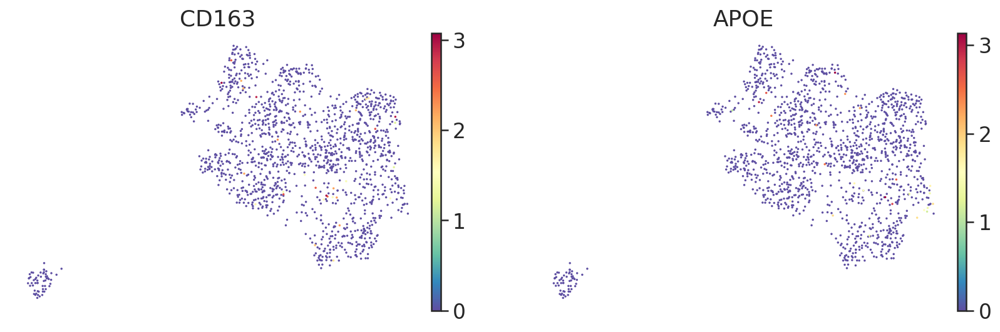

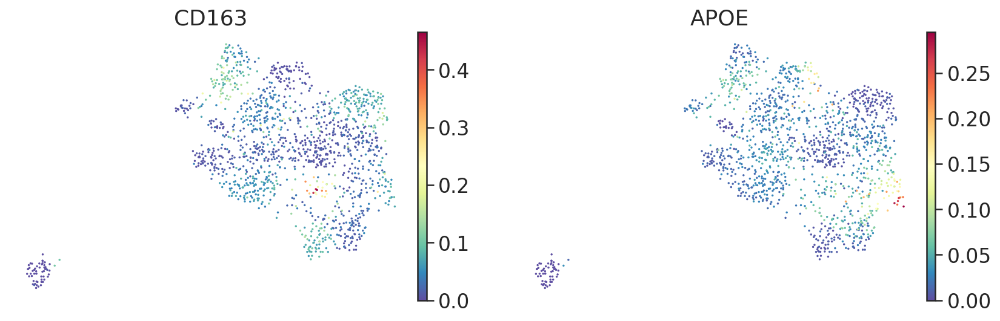

In [135]:
#markers
genes_oi = ['CD14','S100A8','S100A9','CEBPA','CD163','MARCO','APOE','LYVE1','RNASE1','FOLR2']
genes_oi = [x for x in genes_oi if x in adata.var_names]
sc.pl.umap(adata, color = genes_oi, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = genes_oi, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

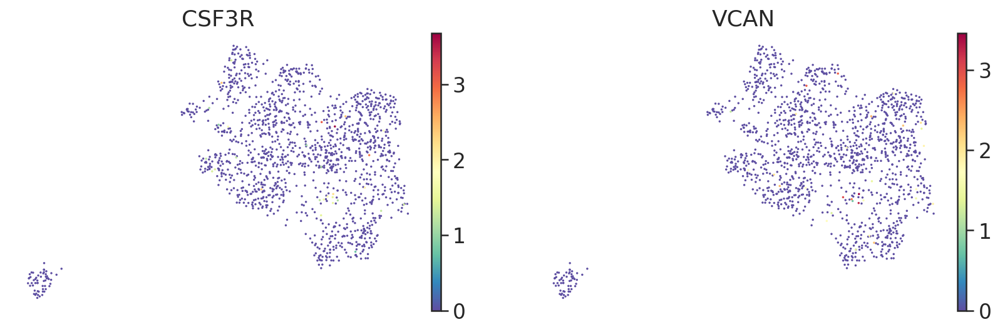

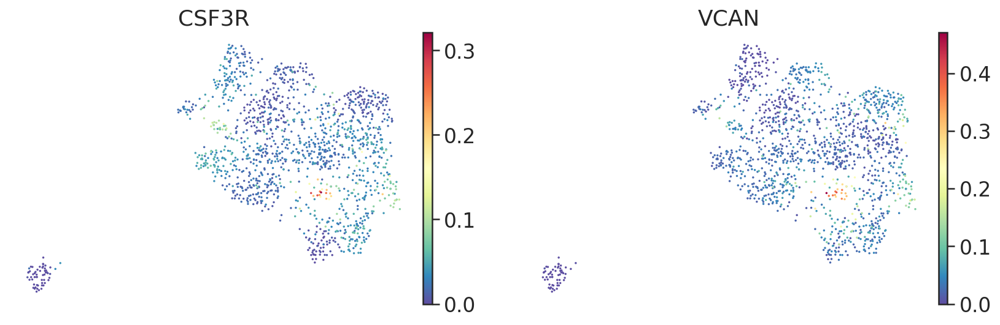

In [136]:
#markers
genes_oi = ['FCGR3B','CSF3R','VCAN','AZU1','CXCR1']
genes_oi = [x for x in genes_oi if x in adata.var_names]
sc.pl.umap(adata, color = genes_oi, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = genes_oi, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

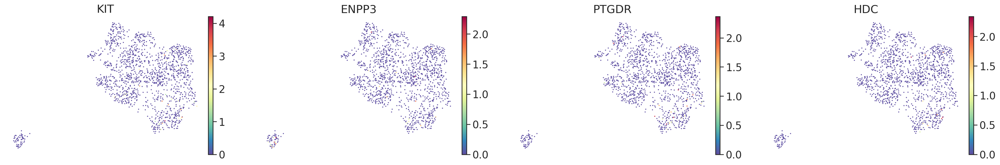

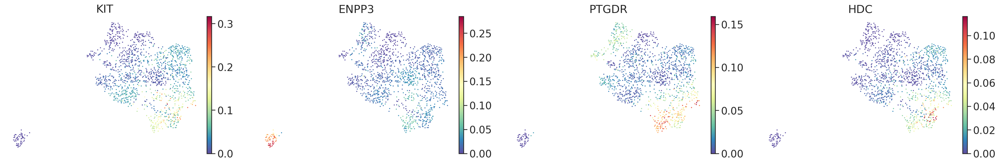

In [137]:
#markers
genes_oi = G.identities['mast']
genes_oi = [x for x in genes_oi if x in adata.var_names]
sc.pl.umap(adata, color = genes_oi, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = genes_oi, layer='imputed', s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

In [138]:
G.identities.keys()

dict_keys(['TCM', 'TSCM', 'CD8-T_KLRG1pos-effector', 'TEM', 'FDC', 'Langerhans', 'B-memory-DN', 'Treg', 'B-memory-non-switched', 'CD56bright-NK', 'mono', 'B-pb-t1', 'NK-adaptive', 'mast', 'TRM', 'CD4-T', 'cDC2', 'p-DC', 'GC-B', 'B-memory-IgM-MZ', 'CD8-T', 'NK', 'T', 'ILC2', 'mo-DC', 'capillary', 'endo-systemic-venous', 'cDC3', 'B', 'gran', 'CD56dim-NK', 'cDC1', 'B-pb-t2', 'Lti', 'plasma', 'B-pb-mature', 'gdT', 'plasma-blast', 'CD8-T-progenitor-exhausted', 'Mac', 'B-memory-switched', 'ILC1', 'ILC3-NCRpos', 'CD8-T_KLRG1neg-effector', 'lung-endo-venous', 'ILC3-NCRneg', 'B-memory', 'endo-aerocyte', 'T-naive', 'B-naive'])

# calculate pairwise rand index

In [139]:
#set parameters
continue_with_adata = False #load new adata indicated by paths below or continue with loaded adata object

#adata paths

pheno_names = ['pheno_var_BP_k10','pheno_var_BP_k20','pheno_var_BP_k30','pheno_var_BP_k40','pheno_var_BP_k50','pheno_var_BP_k60','pheno_var_BP_k70',
              'pheno_var_BP_k80','pheno_var_BP_k90','pheno_var_BP_k100']
#pheno_names = ['pheno_k10','pheno_k20','pheno_k30','pheno_k40','pheno_k50','pheno_k60','pheno_k70',
#             'pheno_k80','pheno_k90','pheno_k100']

In [140]:
from sklearn.metrics import adjusted_rand_score

In [141]:
if continue_with_adata == False:
    adata_sample = sc.read(adata_path)
adata_sample   

AnnData object with n_obs × n_vars = 1462 × 10544
    obs: 'sampleid', 'n_genes', 'n_counts', 'scrublet_scores', 'pid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'batch', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_memory_resting', 'CD4_memory_activated', 'CD4_follicular_helper', 'CD4_regulatory', 'NK_resting', 'NK_activated', 'B_cell', 'Plasma', 'Bcell_naive', 'Bcell_memory', 'IMMUNE', 'PanCAF', 'iCAF', 'myCAF', 'apCAF'

In [142]:
#bootstrap 10000 cells from adata to avoid int overflow,if adata < 100 000 cells use all cells

if len(adata.obs_names) > 100000:
    adata_sample = adata[adata.obs.sample(n=100000, replace=False, random_state=1, axis=0).index,:]

In [143]:
#if you get overflow error that means that the calculation intermediate results are too big to store into np.int64
#this messes up the entire calculatation so you have to downsample the cells
rand_indices = pd.DataFrame(index=pheno_names, columns=pheno_names)

for i in pheno_names:
    for j in pheno_names:
        a = np.int64(np.array(adata_sample.obs[i]))
        b = np.int64(np.array(adata_sample.obs[j]))
        c = adjusted_rand_score(a, b)
        rand_indices.loc[i,j] = c

In [144]:
rand_indices

,pheno_var_BP_k10,pheno_var_BP_k20,pheno_var_BP_k30,pheno_var_BP_k40,pheno_var_BP_k50,pheno_var_BP_k60,pheno_var_BP_k70,pheno_var_BP_k80,pheno_var_BP_k90,pheno_var_BP_k100
pheno_var_BP_k10,1.0,0.720711,0.668566,0.672663,0.645552,0.610402,0.609195,0.60878,0.51962,0.453597
pheno_var_BP_k20,0.720711,1.0,0.8595,0.839751,0.81856,0.778737,0.762563,0.761208,0.660175,0.579215
pheno_var_BP_k30,0.668566,0.8595,1.0,0.919468,0.914396,0.873786,0.865271,0.848031,0.734222,0.645971
pheno_var_BP_k40,0.672663,0.839751,0.919468,1.0,0.935037,0.878701,0.870422,0.859258,0.729457,0.641697
pheno_var_BP_k50,0.645552,0.81856,0.914396,0.935037,1.0,0.919735,0.906042,0.882217,0.750419,0.661628
pheno_var_BP_k60,0.610402,0.778737,0.873786,0.878701,0.919735,1.0,0.957702,0.932282,0.803936,0.710664
pheno_var_BP_k70,0.609195,0.762563,0.865271,0.870422,0.906042,0.957702,1.0,0.942888,0.801465,0.707943
pheno_var_BP_k80,0.60878,0.761208,0.848031,0.859258,0.882217,0.932282,0.942888,1.0,0.827276,0.729883
pheno_var_BP_k90,0.51962,0.660175,0.734222,0.729457,0.750419,0.803936,0.801465,0.827276,1.0,0.871367
pheno_var_BP_k100,0.453597,0.579215,0.645971,0.641697,0.661628,0.710664,0.707943,0.729883,0.871367,1.0


<AxesSubplot:>

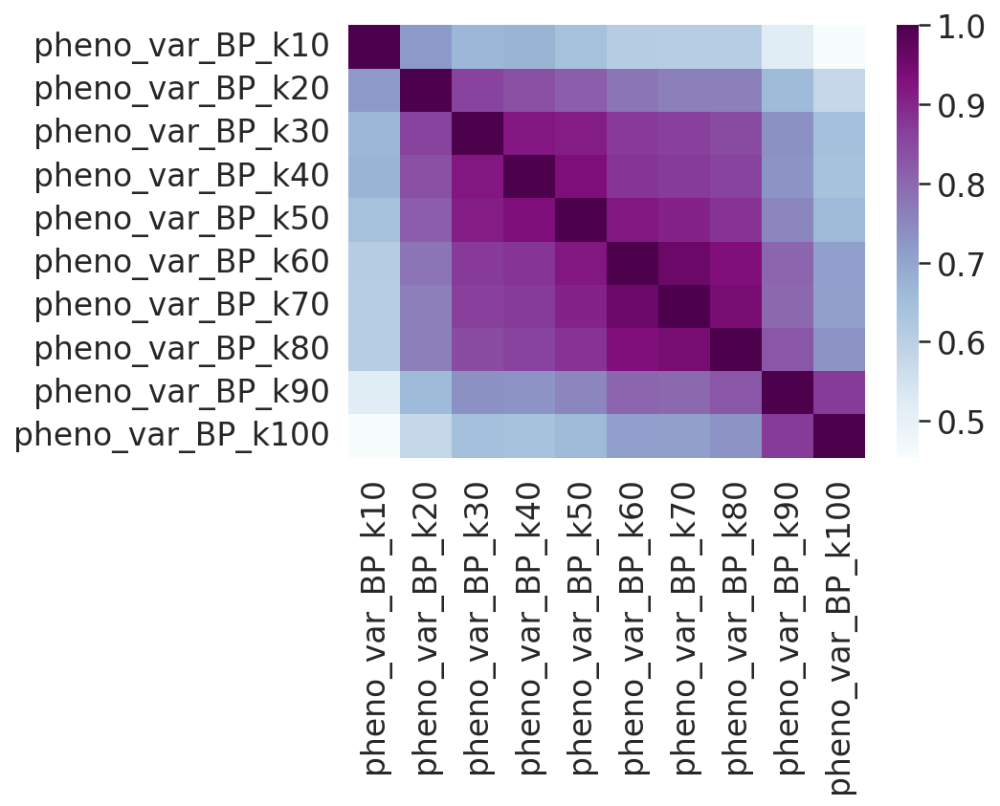

In [145]:
#plot rand indices
sns.heatmap(rand_indices.astype('float'),
                    cmap='BuPu',
                    cbar=True,
                    yticklabels=True,
                    xticklabels=True,
                  # vmax=1,
                   # center=0.5,
                    #vmin=0)
            )

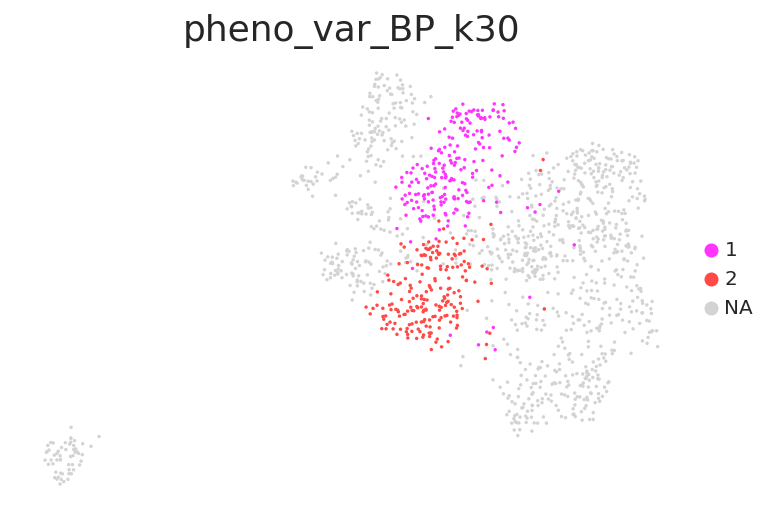

In [173]:
sc.pl.umap(adata, color = pheno_heat, palette=color_map_clusters_nogrey,groups=[1,2], s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

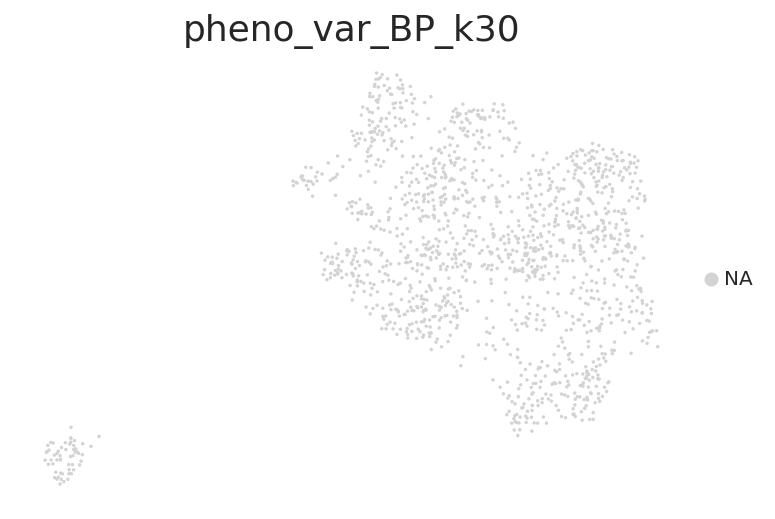

In [147]:
sc.pl.umap(adata, color = pheno_heat, groups=[12],palette=color_map_clusters_nogrey, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)

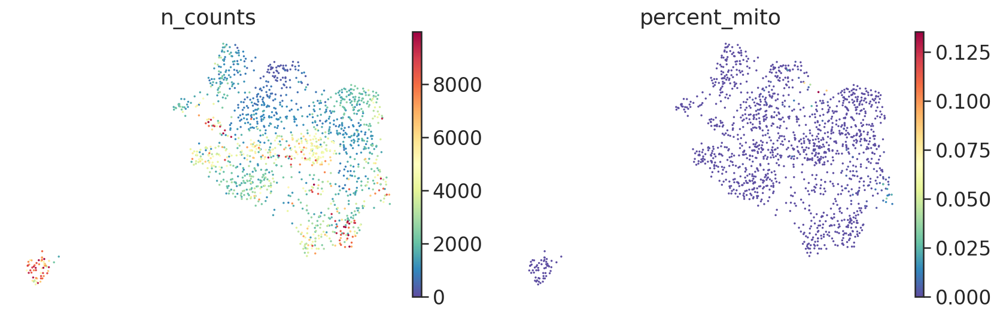

In [148]:
sc.pl.umap(adata, color = ['n_counts','percent_mito'],palette=color_map_clusters_nogrey, s = 12, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)



In [149]:
G.identities.keys()

dict_keys(['TCM', 'TSCM', 'CD8-T_KLRG1pos-effector', 'TEM', 'FDC', 'Langerhans', 'B-memory-DN', 'Treg', 'B-memory-non-switched', 'CD56bright-NK', 'mono', 'B-pb-t1', 'NK-adaptive', 'mast', 'TRM', 'CD4-T', 'cDC2', 'p-DC', 'GC-B', 'B-memory-IgM-MZ', 'CD8-T', 'NK', 'T', 'ILC2', 'mo-DC', 'capillary', 'endo-systemic-venous', 'cDC3', 'B', 'gran', 'CD56dim-NK', 'cDC1', 'B-pb-t2', 'Lti', 'plasma', 'B-pb-mature', 'gdT', 'plasma-blast', 'CD8-T-progenitor-exhausted', 'Mac', 'B-memory-switched', 'ILC1', 'ILC3-NCRpos', 'CD8-T_KLRG1neg-effector', 'lung-endo-venous', 'ILC3-NCRneg', 'B-memory', 'endo-aerocyte', 'T-naive', 'B-naive'])

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


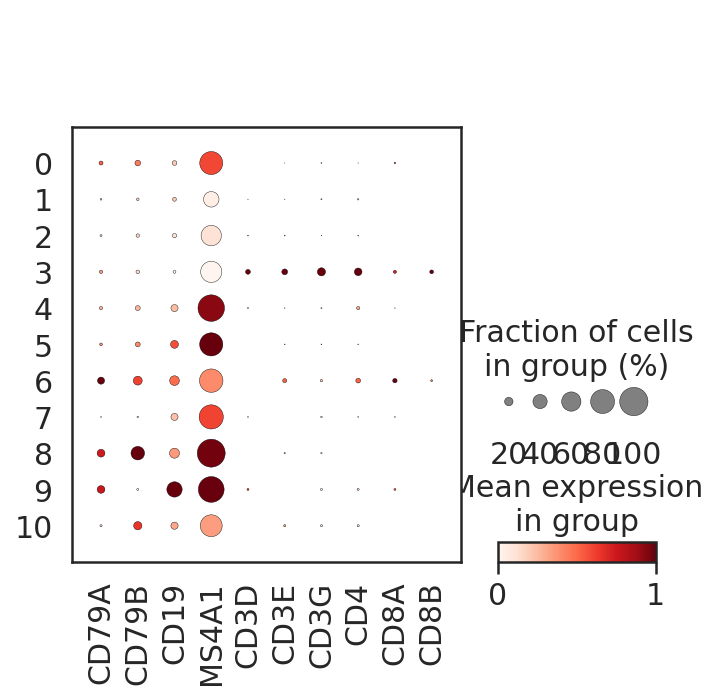

In [171]:
#dotplot
%matplotlib inline
marker_genes_filtered = G.identities['B']+['CD3D','CD3E','CD3G','CD4','CD8A','CD8B']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


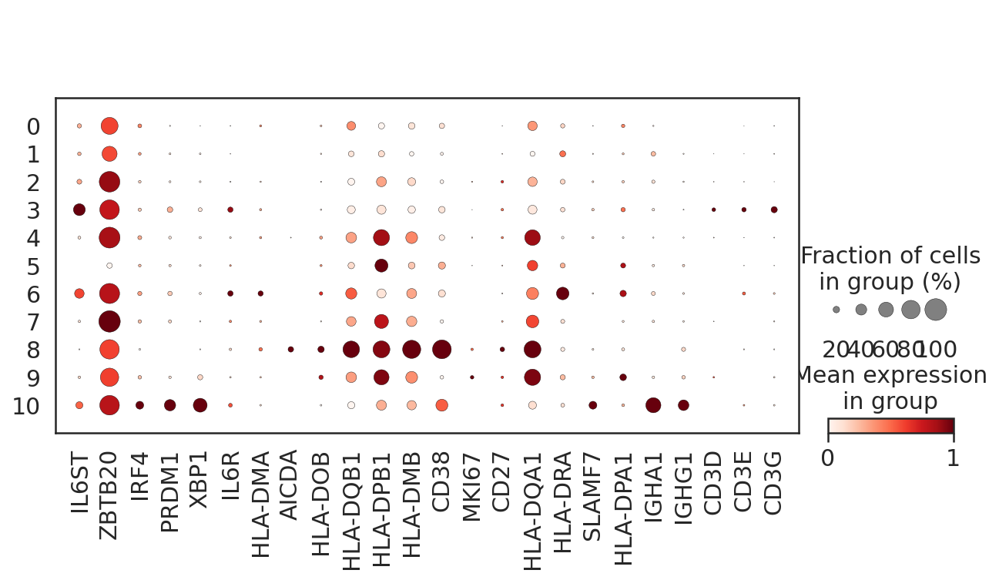

In [151]:
#dotplot
%matplotlib inline
marker_genes_filtered = G.identities['plasma']+['SDC1','IGHA1','IGHG1']+['CD3D','CD3E','CD3G']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


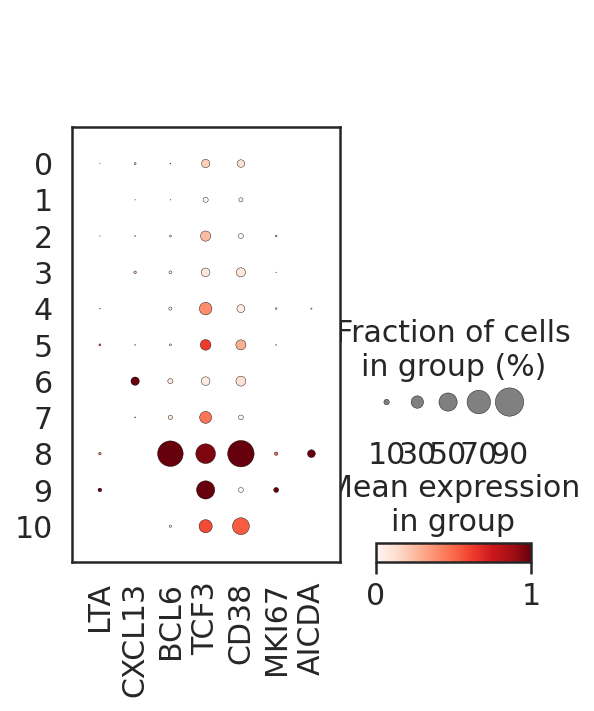

In [152]:
#dotplot
%matplotlib inline
marker_genes_filtered = G.identities['GC-B']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


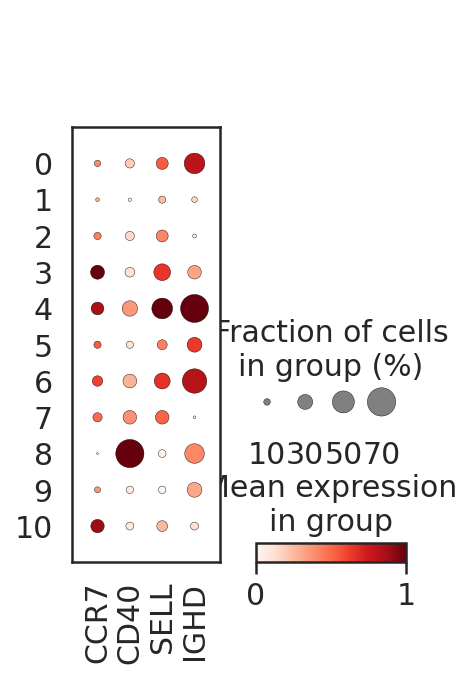

In [153]:
#dotplot
%matplotlib inline
marker_genes_filtered = G.identities['B-naive']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

In [154]:
G.identities.keys()

dict_keys(['TCM', 'TSCM', 'CD8-T_KLRG1pos-effector', 'TEM', 'FDC', 'Langerhans', 'B-memory-DN', 'Treg', 'B-memory-non-switched', 'CD56bright-NK', 'mono', 'B-pb-t1', 'NK-adaptive', 'mast', 'TRM', 'CD4-T', 'cDC2', 'p-DC', 'GC-B', 'B-memory-IgM-MZ', 'CD8-T', 'NK', 'T', 'ILC2', 'mo-DC', 'capillary', 'endo-systemic-venous', 'cDC3', 'B', 'gran', 'CD56dim-NK', 'cDC1', 'B-pb-t2', 'Lti', 'plasma', 'B-pb-mature', 'gdT', 'plasma-blast', 'CD8-T-progenitor-exhausted', 'Mac', 'B-memory-switched', 'ILC1', 'ILC3-NCRpos', 'CD8-T_KLRG1neg-effector', 'lung-endo-venous', 'ILC3-NCRneg', 'B-memory', 'endo-aerocyte', 'T-naive', 'B-naive'])

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


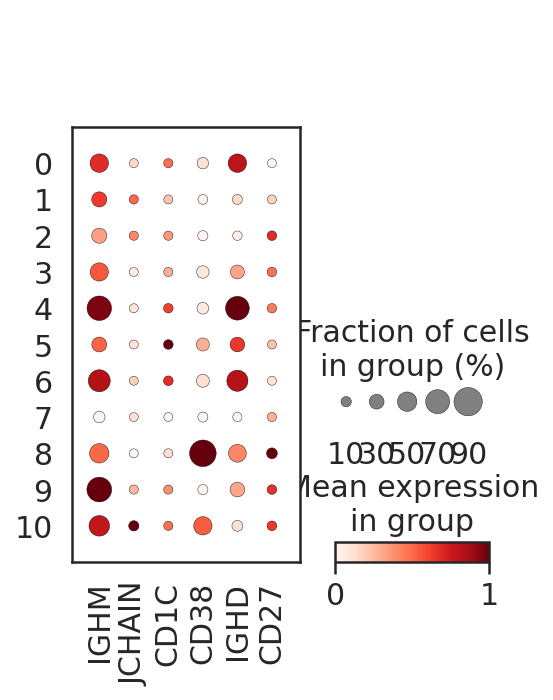

In [172]:
#dotplot
%matplotlib inline
marker_genes_filtered = G.identities['B-memory-non-switched']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var',smallest_dot=20)

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


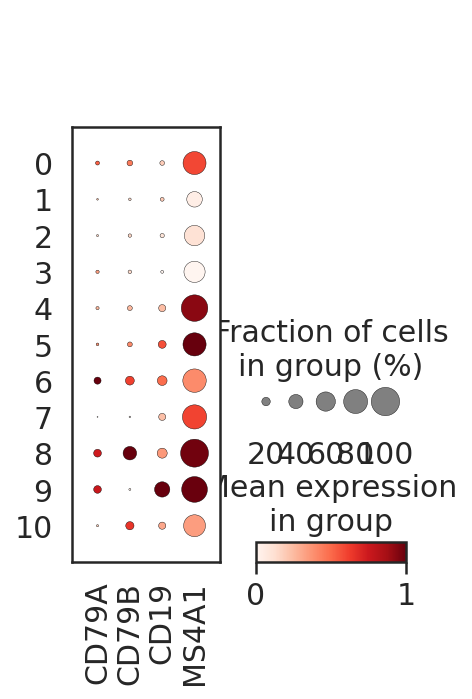

In [156]:
#dotplot
marker_genes_filtered = G.identities['B']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

In [157]:
G.identities.keys()

dict_keys(['TCM', 'TSCM', 'CD8-T_KLRG1pos-effector', 'TEM', 'FDC', 'Langerhans', 'B-memory-DN', 'Treg', 'B-memory-non-switched', 'CD56bright-NK', 'mono', 'B-pb-t1', 'NK-adaptive', 'mast', 'TRM', 'CD4-T', 'cDC2', 'p-DC', 'GC-B', 'B-memory-IgM-MZ', 'CD8-T', 'NK', 'T', 'ILC2', 'mo-DC', 'capillary', 'endo-systemic-venous', 'cDC3', 'B', 'gran', 'CD56dim-NK', 'cDC1', 'B-pb-t2', 'Lti', 'plasma', 'B-pb-mature', 'gdT', 'plasma-blast', 'CD8-T-progenitor-exhausted', 'Mac', 'B-memory-switched', 'ILC1', 'ILC3-NCRpos', 'CD8-T_KLRG1neg-effector', 'lung-endo-venous', 'ILC3-NCRneg', 'B-memory', 'endo-aerocyte', 'T-naive', 'B-naive'])

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


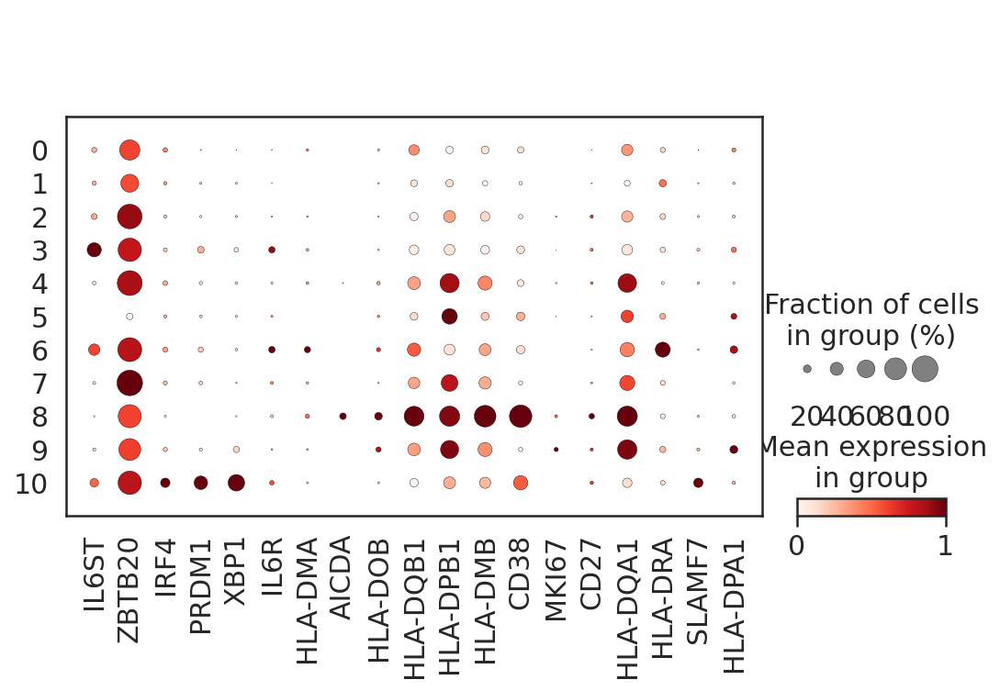

In [158]:
#dotplot
marker_genes_filtered = G.identities['plasma']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


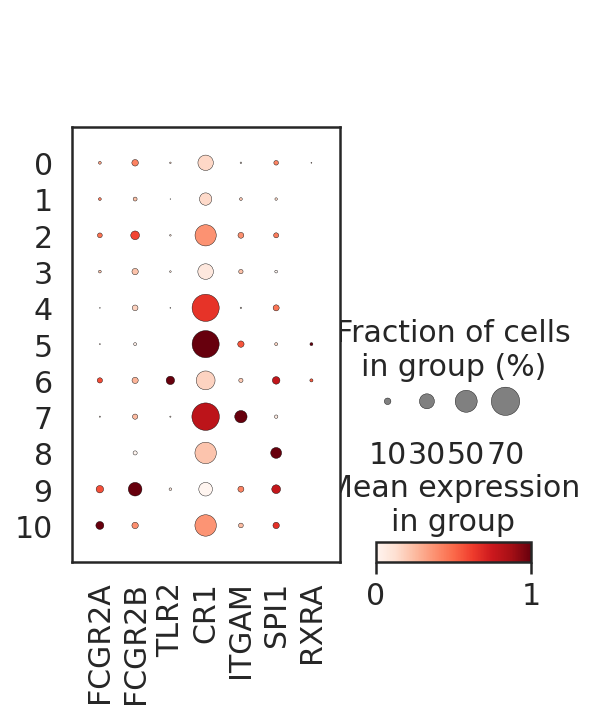

In [159]:
#dotplot
marker_genes_filtered = G.identities['mono']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


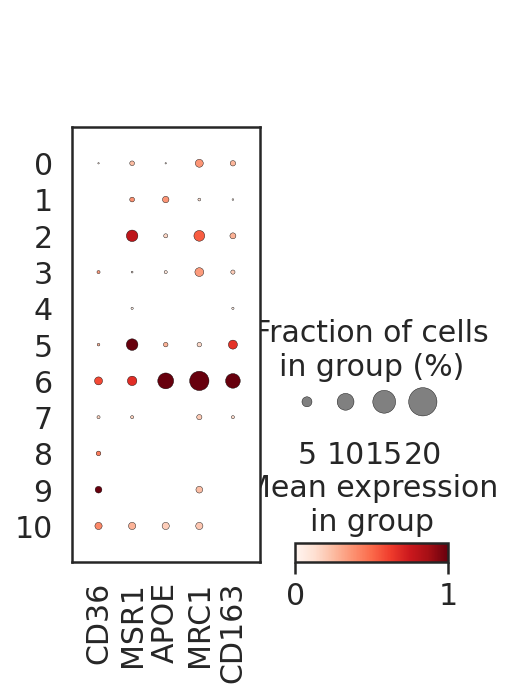

In [160]:
#dotplot
marker_genes_filtered = G.identities['Mac']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


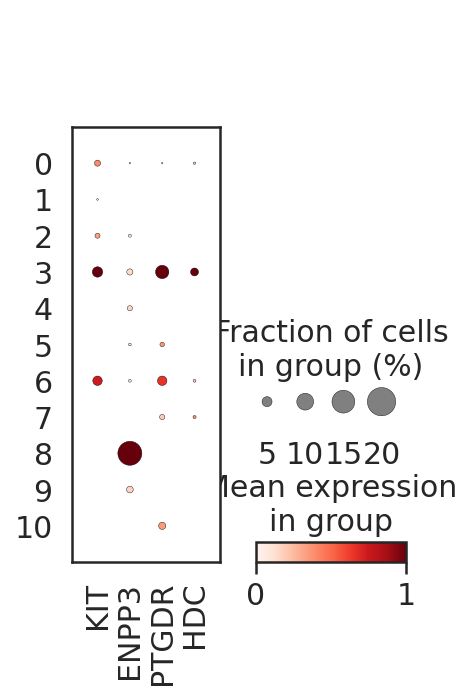

In [161]:
#dotplot
marker_genes_filtered = G.identities['mast']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


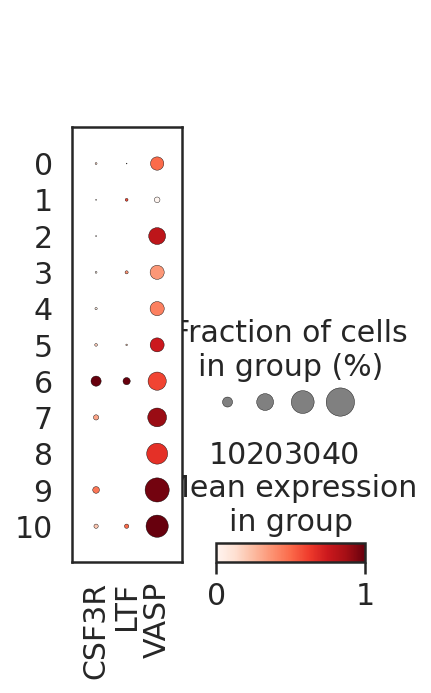

In [162]:
#dotplot
marker_genes_filtered = G.identities['gran']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


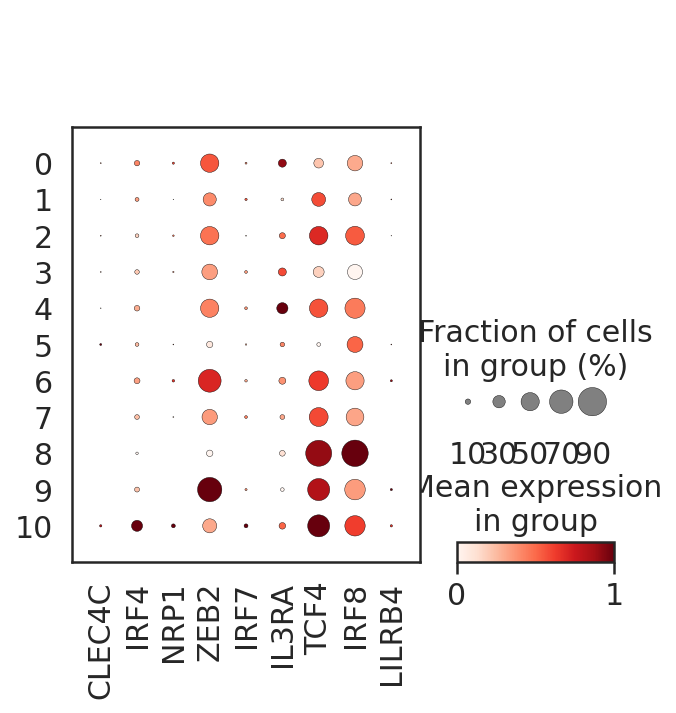

In [163]:
#dotplot
marker_genes_filtered = G.identities['p-DC']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


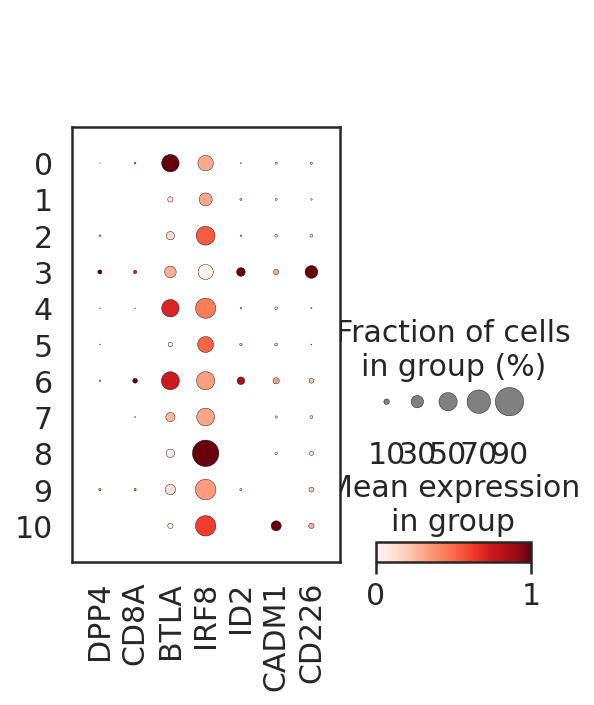

In [164]:
#dotplot
marker_genes_filtered = G.identities['cDC1']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


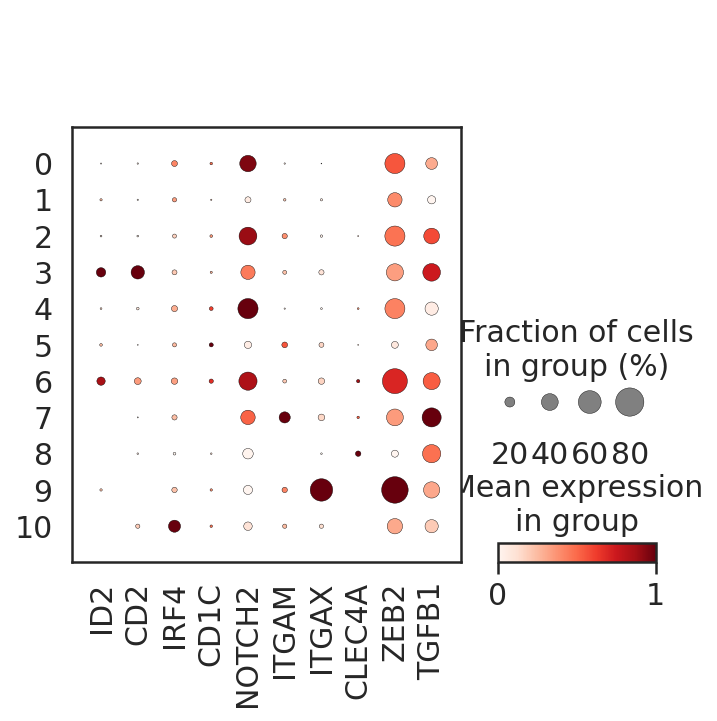

In [165]:
#dotplot
marker_genes_filtered = G.identities['cDC2']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


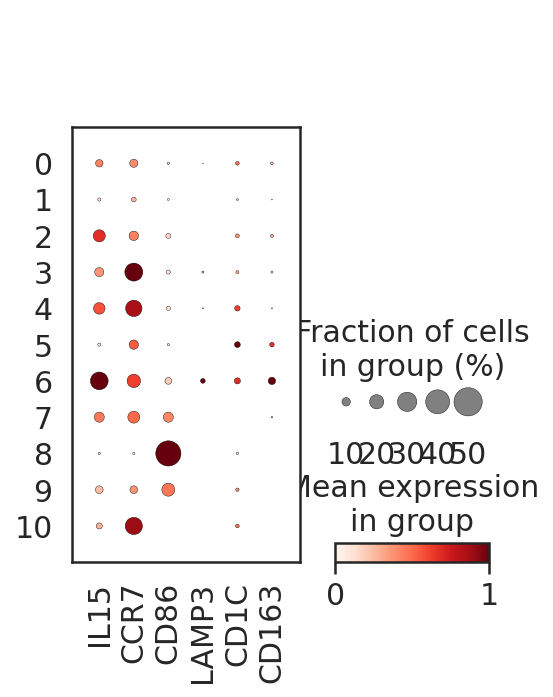

In [166]:
#dotplot
marker_genes_filtered = G.identities['cDC3']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

    using 'X_pca' with n_pcs = 62
Storing dendrogram info using `.uns['dendrogram_pheno_var_BP_k30']`


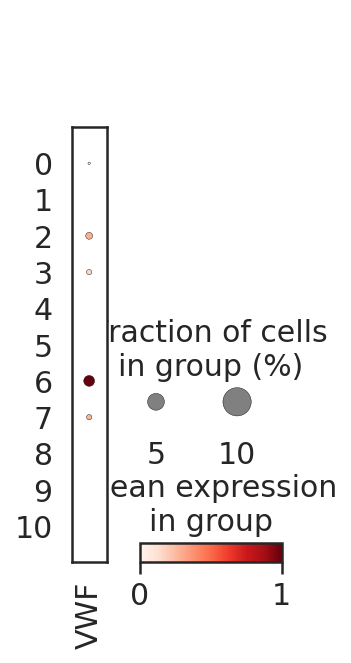

In [167]:
#dotplot
marker_genes_filtered = ['EPCAM','EGFR','COL3A1','JAM2','VWF']
marker_genes_filtered = [x for x in marker_genes_filtered if x in adata.var_names]
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, standard_scale='var')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


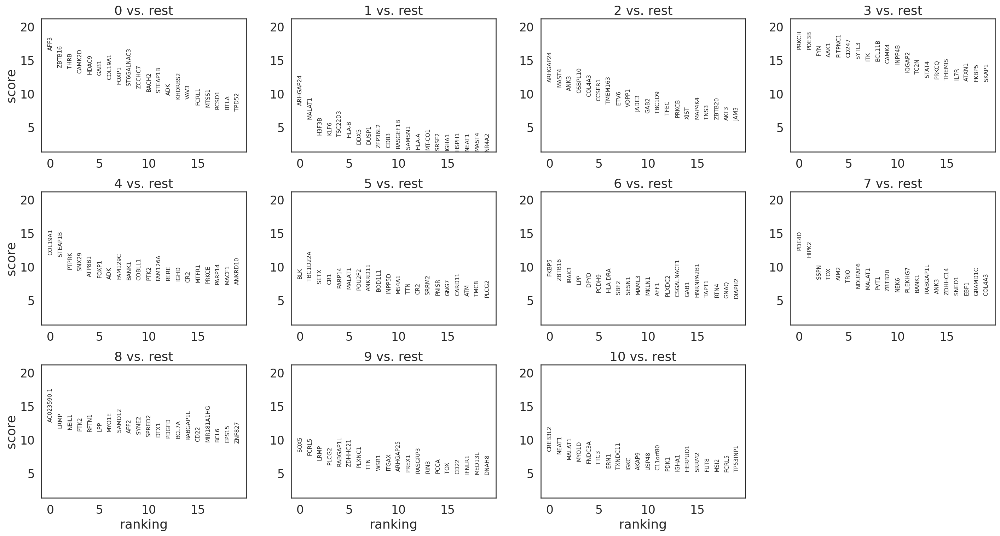

In [168]:
sc.tl.rank_genes_groups(adata, pheno_heat, method='wilcoxon')
sc.pl.rank_genes_groups(adata)

In [174]:
annotation_dict = {0:'B-naive',
                  1:'B',
                  2:'B',
                  3:'B-T_doublet',
                  4:'B-naive',
                  5:'B-naive',
                  6:'B-naive',
                  7:'B-memory-DN',
                  8:'GC-B',
                  9:'B_proliferating',
                  10:'plasma'}

In [176]:
adata.obs['annotation'] = adata.obs['pheno_var_BP_k30'].map(annotation_dict)
set(adata.obs['annotation'] )

{'B',
 'B-T_doublet',
 'B-memory-DN',
 'B-naive',
 'B_proliferating',
 'GC-B',
 'plasma'}

In [179]:
adata.obs['pheno_annotate']  = ['BP_'+str(x) for x in adata.obs['pheno_var_BP_k30']]
set(adata.obs['pheno_annotate'] )

{'BP_0',
 'BP_1',
 'BP_10',
 'BP_2',
 'BP_3',
 'BP_4',
 'BP_5',
 'BP_6',
 'BP_7',
 'BP_8',
 'BP_9'}

In [181]:
adata.write('/data/peer/wallet/Jupyter/2023_Particle_SASP/data/TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP_2500hv.h5ad')

In [7]:
adata = sc.read('/data/peer/wallet/Jupyter/2023_Particle_SASP/data/TIL-X-PAAD-X-snRNAseq-X-2022-X-Hwang-X-10.1038_s41588-022-01134-8-X-all_cells_Milo_immune_2500hv_annotated_BP_2500hv.h5ad')

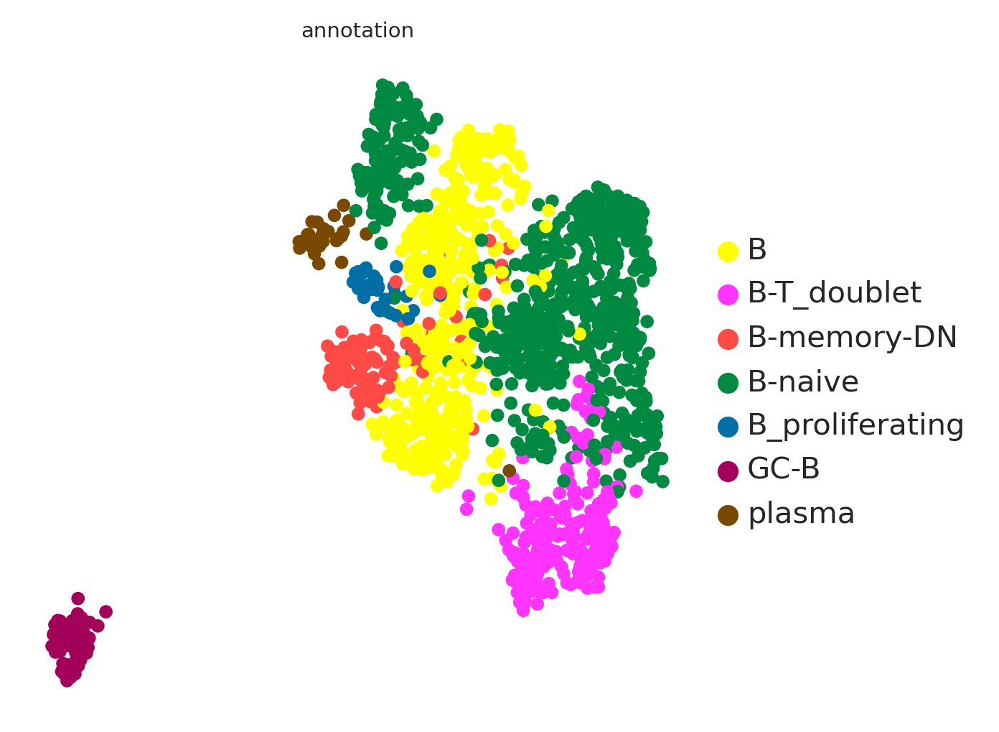

In [8]:
sc.pl.umap(adata, color = 'annotation',
           palette=color_map_clusters_nogrey, s = 80, cmap= 'Spectral_r', legend_fontsize = 10, vmin=0)